# IBM Applied Data Science Capstone Project


In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn import preprocessing
from scipy import stats
import scipy as sp
import random
import seaborn as sns
from sklearn.metrics import accuracy_score,f1_score,log_loss,classification_report,confusion_matrix,jaccard_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import pydotplus
import matplotlib.image as mpimg
from io import StringIO
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import folium
import webbrowser
from folium import plugins

## Introduction: Business Undertanding

Nowadays, people have witnessed and recorded many car collisions. Facing with so much collisions data, data scientists come up with new perspective to these data. Based on these past records, people are likely to gain the insights into the data, and to explore these possible factors which influence the happen of collisions. Therefore people want to know if some of the factors such as weather, road condition, light condition and speeding can influence and involve in the collisions. And do these factors influence the severity of the collisions. More important, scientists want to use these evidence to build a series of reliable models to predict how much these conditions can influence the collisions. So that people are capable of decreasing the possibility of car accident based on the weather or road condition.

## Data

For this research, I used the data set from 'Collisions—All Years' table. This table includes all collisions provided by SPD and recorded by Traffic Records in Seattle region from 2004 to present. The table includes over one hundred ninety-four thousand rows and thirty-eight columns. It includes the explicit location and location type of collisions, the severity of the collision, the date and time of the collision, the total number of people involved in the collision, and also the weather, road condition, light condition, etc. The table also labeled whether the collision was due to inattention and whether the driver was under the influence of drugs or alcohol, which means we can exclude the human factors to search for the environment factors.

In [99]:
data = pd.read_csv("/Users/yushan/Downloads/Data-Collisions.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

In [100]:
# Create Map of 1000 accidents
map = folium.Map(location=[47.60, -122.33], zoom_start=12)
marker_cluster = MarkerCluster().add_to(map)
locations = data[['Y', 'X']][data['Y'].notna()].head(1000)
locationlist = locations.values.tolist()
for point in range(len(locations)):
    folium.Marker(locationlist[point]).add_to(marker_cluster)
map

The SEVERITYCODE field contains a code that corresponds to the severity of the
collision. and SEVERITYDESC contains a detailed description of the severity of the collision.


| SEVERITYCODE | Description |
| :-: | --- |
| 1 | property damage |
| 2 | injury |
| 2b | serious injuries |
| 3 | fatality |
| 0 | unknown |

In [101]:
#Converting Severity Code from (1/2) tp (0/1)
severity_code = data['SEVERITYCODE'].values
labels = preprocessing.LabelEncoder()
labels.fit([1, 2])
severity_code = labels.transform (severity_code)
data["SEVERITYCODE"] = severity_code

In [102]:
data['SEVERITYCODE'].value_counts().to_frame('count')

,count
0,136485
1,58188


### Descriptive Statistics 

In [103]:
descriptive_stats= data.describe(include="all")

In [104]:
descriptive_stats_plot=descriptive_stats[["INATTENTIONIND","UNDERINFL","WEATHER","ROADCOND","LIGHTCOND","SPEEDING","SEVERITYCODE"]]
descriptive_stats_plot.drop(['unique','top','freq','mean','std','min','max','25%','50%','75%'],axis=0,inplace=True)
descriptive_stats_plot=descriptive_stats_plot.transpose()

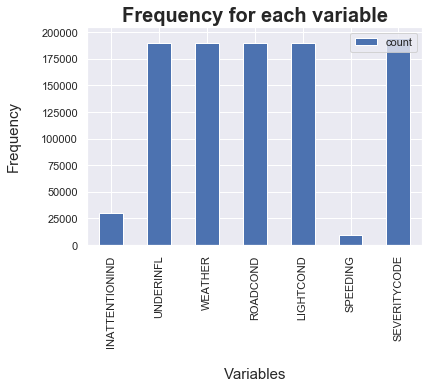

In [105]:
#color_yo=['sandybrown','sienna','sienna','sienna','sienna','sandybrown','sienna']
descriptive_stats_plot.plot(kind='bar')
plt.title('Frequency for each variable', fontsize=20, fontweight='bold')
plt.xlabel("Variables",fontsize=15,labelpad=20)
plt.ylabel("Frequency",fontsize=15,labelpad=20)
plt.show()

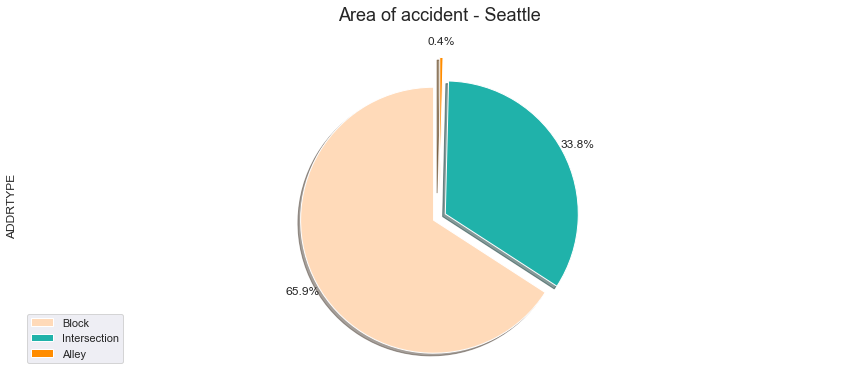

In [106]:
#Area type of each accident
explode_list = [0.05, 0.05, 0.2]
color_list=['peachpuff','lightseagreen','darkorange']
addtype=data['ADDRTYPE'].value_counts()

addtype.plot(kind='pie',
            figsize=(15, 6),
            autopct='%1.1f%%',
            startangle=90,
            shadow=True,
            labels=None,
            pctdistance=1.12,
            colors=color_list,
            explode=explode_list)


plt.title('Area of accident - Seattle', fontsize=18, y=1.05)
plt.axis('equal')
plt.legend(labels=addtype.index, loc='lower left')

plt.show()

In [107]:
#Check IncKey unqiue numbers
data['INCKEY'].nunique()

194673

In [108]:
#Encoding in attention (0 = No, 1 = Yes)
data["INATTENTIONIND"].replace("Y", 1, inplace=True)
data["INATTENTIONIND"].replace(np.nan, 0, inplace=True)

In [109]:
data['INATTENTIONIND'].value_counts().to_frame('count')

,count
0.0,164868
1.0,29805


In [110]:
#Encoding Under the influence (0 = No, 1 = Yes)
data["UNDERINFL"].replace("N", 0, inplace=True)
data["UNDERINFL"].replace("Y", 1, inplace=True)

In [111]:
data['UNDERINFL'].value_counts().to_frame('count')

,count
0,100274
0,80394
1,5126
1,3995


In [112]:
#Encoding Speeding(0 = No, 1 = Yes)
data["SPEEDING"].replace("Y", 1, inplace=True)
data["SPEEDING"].replace(np.nan, 0, inplace=True)

In [113]:
data['SPEEDING'].value_counts().to_frame('count')

,count
0.0,185340
1.0,9333


In [114]:
#Encoding Light Conditions(0 = Light, 1 = Medium, 2 = Dark)
data["LIGHTCOND"].replace("Daylight", 0, inplace=True)
data["LIGHTCOND"].replace("Dark - Street Lights On", 1, inplace=True)
data["LIGHTCOND"].replace("Dark - No Street Lights", 2, inplace=True)
data["LIGHTCOND"].replace("Dusk", 1, inplace=True)
data["LIGHTCOND"].replace("Dawn", 1, inplace=True)
data["LIGHTCOND"].replace("Dark - Street Lights Off", 2, inplace=True)
data["LIGHTCOND"].replace("Dark - Unknown Lighting", 2, inplace=True)
data["LIGHTCOND"].replace("Other","Unknown", inplace=True)

In [115]:
data['LIGHTCOND'].value_counts().to_frame('count')

,count
0,116137
1,56911
Unknown,13708
2,2747


In [116]:
#Encoding Weather Conditions(0 = Clear, 1 = Overcast and Cloudy, 2 = Windy, 3 = Rain and Snow
data["WEATHER"].replace("Clear", 0, inplace=True)
data["WEATHER"].replace("Raining", 3, inplace=True)
data["WEATHER"].replace("Overcast", 1, inplace=True)
data["WEATHER"].replace("Other", "Unknown", inplace=True)
data["WEATHER"].replace("Snowing", 3, inplace=True)
data["WEATHER"].replace("Fog/Smog/Smoke", 2, inplace=True)
data["WEATHER"].replace("Sleet/Hail/Freezing Rain", 3, inplace=True)
data["WEATHER"].replace("Blowing Sand/Dirt", 2, inplace=True)
data["WEATHER"].replace("Severe Crosswind", 2, inplace=True)
data["WEATHER"].replace("Partly Cloudy", 1, inplace=True)

In [117]:
data['WEATHER'].value_counts().to_frame('count')

,count
0,111135
3,34165
1,27719
Unknown,15923
2,650


In [118]:
#Encoding Road Conditions(0 = Dry, 1 = Mushy, 2 = Wet)
data["ROADCOND"].replace("Dry", 0, inplace=True)
data["ROADCOND"].replace("Wet", 2, inplace=True)
data["ROADCOND"].replace("Ice", 2, inplace=True)
data["ROADCOND"].replace("Snow/Slush", 1, inplace=True)
data["ROADCOND"].replace("Other", "Unknown", inplace=True)
data["ROADCOND"].replace("Standing Water", 2, inplace=True)
data["ROADCOND"].replace("Sand/Mud/Dirt", 1, inplace=True)
data["ROADCOND"].replace("Oil", 2, inplace=True)


In [119]:
data['ROADCOND'].value_counts().to_frame('count')

,count
0,124510
2,48862
Unknown,15210
1,1079


### Data Pre-processing

Checking for blanks and duplicated records.

Selecting relevant fields and dropping others.

In [120]:
#Making new dataframe with only variables and unique keys
selected_columns=data[["X","Y","INCKEY","INATTENTIONIND","UNDERINFL","WEATHER","ROADCOND","LIGHTCOND","SPEEDING","SEVERITYCODE"]]
feature_df=selected_columns.copy()
feature_df.dropna(axis=0,how='any',inplace=True)
feature_stats=feature_df.describe()

In [121]:
np.count_nonzero(feature_df['UNDERINFL'])

86923

In [122]:
#Light Condition
lightcondsize = feature_df ["LIGHTCOND"].size

featureinlightcond = feature_df ['LIGHTCOND'] == 'Unknown'

lightcond = feature_df['LIGHTCOND']
lightcond = lightcond.values
lightcond = lightcond[featureinlightcond]

lightcond[0:9036]=0
lightcond[9036:13417]=1
lightcond[13417:13961]=2

feature_df.loc [feature_df.LIGHTCOND == "Unknown", 'LIGHTCOND'] = lightcond

feature_df["LIGHTCOND"]=feature_df["LIGHTCOND"].astype(int)

In [123]:
#Road Condition
roadcondsize = feature_df ["ROADCOND"].size

featureinroadcond = feature_df ['ROADCOND'] == 'Unknown'

roadcond = feature_df['LIGHTCOND']
roadcond = roadcond.values
roadcond = roadcond[featureinroadcond]

roadcond[0:9954]=0
roadcond[9954:10040]=1
roadcond[10040:15163]=2

feature_df.loc[feature_df.ROADCOND == "Unknown", 'ROADCOND'] = roadcond
feature_df["ROADCOND"]=feature_df["ROADCOND"].astype(int)

In [124]:
#Weather Condition
weathersize = feature_df ["WEATHER"].size

featureinweather = feature_df ['WEATHER'] == 'Unknown'

weather = feature_df['WEATHER']
weather = weather.values
weather = weather[featureinweather]

weather[0:10151]=0
weather[10151:12683]=1
weather[12683:12742]=2
weather[12742:15864]=3

feature_df.loc[feature_df.WEATHER == "Unknown", 'WEATHER'] = weather
feature_df["WEATHER"]=feature_df["WEATHER"].astype(int)

In [125]:
#Converting remaining to int
feature_df["SPEEDING"]=feature_df["SPEEDING"].astype(int)
feature_df["INATTENTIONIND"]=feature_df["INATTENTIONIND"].astype(int)
feature_df["UNDERINFL"]=feature_df["UNDERINFL"].astype(int)

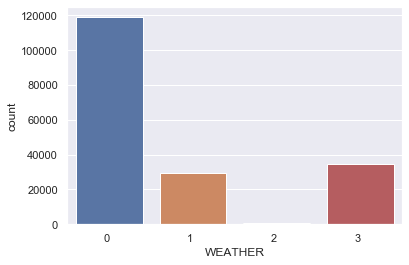

In [126]:
ax = sns.countplot(feature_df['WEATHER'])
ax.set_xticklabels(ax.get_xticklabels(), 
                   horizontalalignment='right')
plt.show()

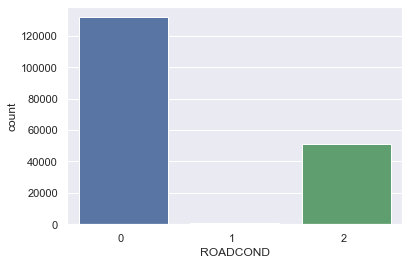

In [127]:
ax = sns.countplot(feature_df['ROADCOND'])
ax.set_xticklabels(ax.get_xticklabels(), 
                   horizontalalignment='right')
plt.show()

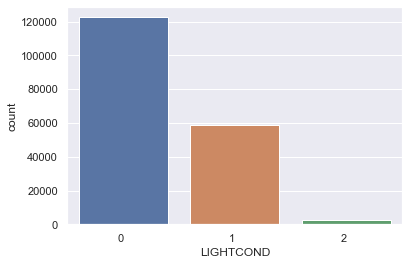

In [128]:
ax = sns.countplot(feature_df['LIGHTCOND'])
ax.set_xticklabels(ax.get_xticklabels(), 
                   horizontalalignment='right')
plt.show()

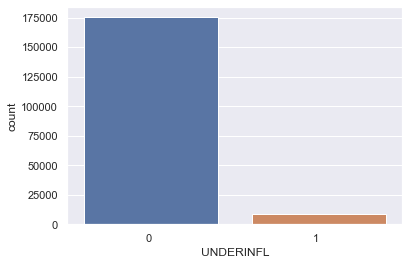

In [129]:
ax = sns.countplot(feature_df['UNDERINFL'])
ax.set_xticklabels(ax.get_xticklabels(), 
                   horizontalalignment='right')
plt.show()

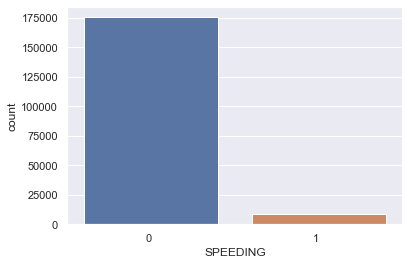

In [130]:
ax = sns.countplot(feature_df['SPEEDING'])
ax.set_xticklabels(ax.get_xticklabels(), 
                   horizontalalignment='right')
plt.show()

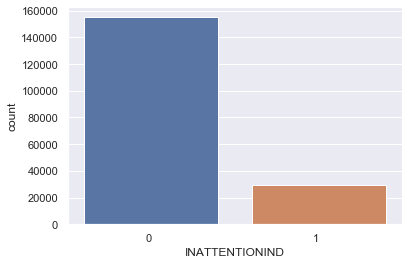

In [131]:
ax = sns.countplot(feature_df['INATTENTIONIND'])
ax.set_xticklabels(ax.get_xticklabels(), 
                   horizontalalignment='right')
plt.show()

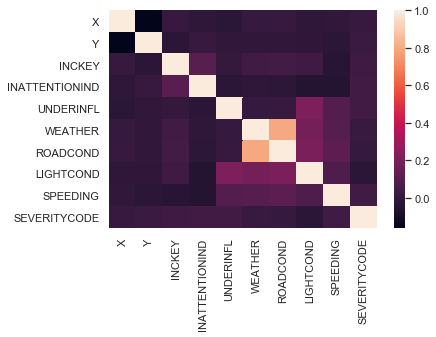

In [132]:
sns.heatmap(feature_df.corr())
plt.show()

In [133]:
#ML Feature Sets
X=feature_df[["SPEEDING","INATTENTIONIND","UNDERINFL","ROADCOND","WEATHER","LIGHTCOND"]].values
y=feature_df[["SEVERITYCODE"]].values

In [134]:
#Test/Train split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (128916, 6) (128916, 1)
Test set: (55251, 6) (55251, 1)


In [142]:
#from imblearn.over_sampling import SMOTE

In [143]:
# Balance the Data
#os = SMOTE(random_state=42)
#os_data_X, os_data_y= os.fit_sample(X_train, y_train)

AttributeError: 'SMOTE' object has no attribute '_validate_data'

In [138]:
#Make reduced df from feature_df to get a few random points to make map
limit = 100005
reduced_df = feature_df.iloc [0:limit:5, 0:]

In [144]:
#Folium Map
# let's start again with a clean copy of the map of San Francisco
seattle_map = folium.Map(location=[47.61536892, -122.3302243], zoom_start=10)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(reduced_df.Y, reduced_df.X, reduced_df.SEVERITYCODE):
    folium.Marker(
    location=[lat, lng],
    icon=None,
    popup=label,
    ).add_to(incidents)

seattle_map.add_child(incidents)

### Modelling and Evaluation

Decision Tree makes decision with tree-like model. It splits the sample into two or more homogenous sets (leaves) based on the most significant differentiators in the input variables. To choose a differentiator (predictor), the algorithm considers all features and does a binary split on them (for categorical data, split by category; for continuous, pick a cut-off threshold). It will then choose the one with the least cost (i.e. highest accuracy), and repeats recursively, until it successfully splits the data in all leaves (or reaches the maximum depth).

Information gain for a decision tree classifier can be calculated either using the Gini Index measure or the Entropy measure, whichever gives a greater gain. A hyper parameter Decision Tree Classifier was used to decide which tree to use, DTC using entropy had greater information gain; hence it was used for this classification problem.

In [145]:
#Decision Tree Clasifier
DT = DecisionTreeClassifier(criterion="entropy", max_depth=6)
DT.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [146]:
#Make Prediction:
yhatDT = DT.predict(X_test)

In [147]:
 #Check Accuracy
print('Accuracy score for Decision Tree = ', accuracy_score(yhatDT, y_test))

Accuracy score for Decision Tree =  0.6960055021628567


In [148]:
 #Visualization
print('Confusion Matrix - Decision Tree')
print(pd.crosstab(y_test.ravel(), yhatDT.ravel(), rownames = ['True'], colnames = ['Predicted'], margins = True))

print(classification_report(yhatDT,y_test))

Confusion Matrix - Decision Tree
Predicted      0   1    All
True                       
0          38421  24  38445
1          16772  34  16806
All        55193  58  55251
              precision    recall  f1-score   support

           0       1.00      0.70      0.82     55193
           1       0.00      0.59      0.00        58

    accuracy                           0.70     55251
   macro avg       0.50      0.64      0.41     55251
weighted avg       1.00      0.70      0.82     55251



In [149]:
#COnfusion Matrix
from sklearn.metrics import classification_report, confusion_matrix
import itertools

In [150]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [151]:
   #Plot it
cnf_matrix = confusion_matrix(y_test, yhatDT, labels=[1,0])
np.set_printoptions(precision=2)

Confusion matrix, without normalization
[[   34 16772]
 [   24 38421]]


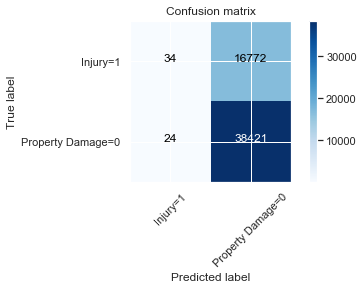

In [152]:
  # Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Injury=1','Property Damage=0'],normalize= False,  title='Confusion matrix')



Random Forest Classifier is an ensemble (algorithms which combines more than one algorithms of same or different kind for classifying objects) tree-based learning algorithm. RFC is a set of decision trees from randomly selected subset of training set. It aggregates the votes from different decision trees to decide the final class of the test object. Used for both classification and regression.

Similar to DTC, RFT requires an input that specifies a measure that is to be used for classification, along with that a value for the number of estimators (number of decision trees) is required. A hyper parameter RFT was used to determine the best choices for the above mentioned parameters. RFT with 75 DT’s using entropy as the measure gave the best accuracy when trained and tested on pre-processed accident severity dataset.

In [154]:
from sklearn.ensemble import RandomForestClassifier
rfcModel = RandomForestClassifier(n_estimators=75)
rfcModel.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=75,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [155]:
yhatRF = rfcModel.predict(X_test)

In [156]:
print(classification_report(y_test, yhatRF))

              precision    recall  f1-score   support

           0       0.70      1.00      0.82     38445
           1       0.54      0.00      0.01     16806

    accuracy                           0.70     55251
   macro avg       0.62      0.50      0.41     55251
weighted avg       0.65      0.70      0.57     55251



In [166]:
 #Check Accuracy
print('Accuracy score for Decision Tree = ', accuracy_score(yhatRF, y_test))

Accuracy score for Decision Tree =  0.696041700602704


In [157]:
cnf_matrix = confusion_matrix(y_test, yhatEF, labels=[1,0])
np.set_printoptions(precision=2)

NameError: name 'yhatEF' is not defined

Confusion matrix, without normalization
[[   34 16772]
 [   24 38421]]


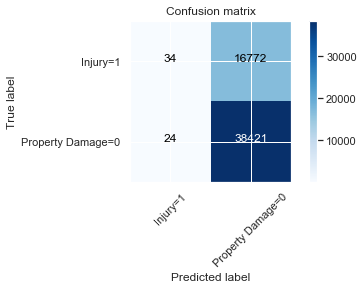

In [158]:
# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Injury=1','Property Damage=0'],normalize= False,  title='Confusion matrix')



Logistic Regression is a classifier that estimates discrete values (binary values like 0/1, yes/no, true/false) based on a given set of an independent variables. It basically predicts the probability of occurrence of an event by fitting data to a logistic function. Hence it is also known as logistic regression. The values obtained would always lie within 0 and 1 since it predicts the probability.

The chosen dataset has more than two target categories in terms of the accident severity code assigned, one-vs-one (OvO) strategy is employed.

In [169]:
#Logistic Regression
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)

yhatLR = LR.predict(X_test)
yhat_prob = LR.predict_proba(X_test)

print(log_loss(y_test, yhat_prob))

print ("Accuracy", accuracy_score(yhatLR,y_test))
print (classification_report(y_test, yhatLR))


0.6108557143303655
Accuracy 0.6956435177643844
              precision    recall  f1-score   support

           0       0.70      1.00      0.82     38445
           1       0.22      0.00      0.00     16806

    accuracy                           0.70     55251
   macro avg       0.46      0.50      0.41     55251
weighted avg       0.55      0.70      0.57     55251



In [167]:
cnf_matrix = confusion_matrix(y_test, yhatLR, labels=[1,0])
np.set_printoptions(precision=2)

Confusion matrix, without normalization
[[    4 16802]
 [   14 38431]]


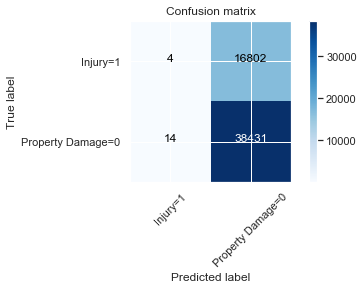

In [168]:
# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Injury=1','Property Damage=0'],normalize= False,  title='Confusion matrix')


### Results

The accuracies of all models was around 60%-69% which means we can roughly predict the severity of an accident. 

### Conclusion

Initially, the classifiers had an prediction accuracy of 60%-69%, however, we find there are imbalance of data.

We can conclude that this model can roughly predict the severity of car accidents in Seattle. And the performance of models may be improved after adjusting the imbalance.

### Future Work

The trained model can be deployed onto governance and monitoring web and mobile applications to predict the accident severity for a given set of parameters.